##Задание 3

### Загрузка картинки

Populating the interactive namespace from numpy and matplotlib
(<type 'numpy.ndarray'>, (1050, 1680, 3))


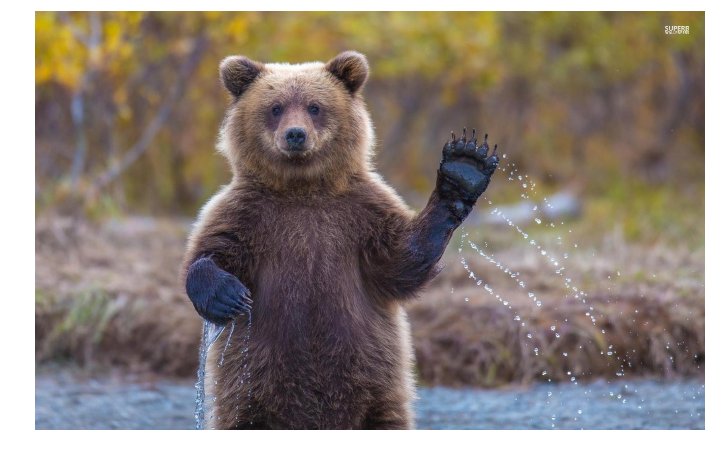

In [1]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
%pylab inline
picture = plt.imread('bear2.png')
print(type(picture), picture.shape)

plt.figure(figsize=(12,9))
plt.imshow(picture)
plt.axis('off')
plt.show()

In [2]:
X = picture.reshape((105 * 168, 10 * 10 * 3))

In [3]:
pca = PCA(n_components=20)
transform_X = pca.fit_transform(X)

In [4]:
len(transform_X)

17640

### Визуализируем главные компоненты, преобразуя их к картинкам размера 10 x 10

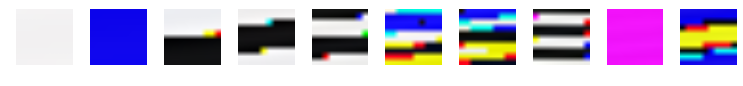

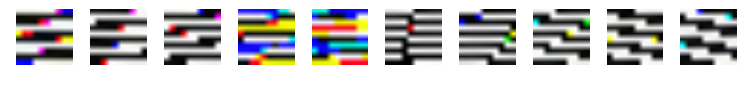

In [5]:
for i in range(2):
    plt.figure(figsize=(13, 1))
    
    for j in range(10):
        plt.subplot(1, 10, j + 1)
        plt.imshow(pca.components_[i * 10 + j].reshape((10, 10,3)))
        plt.axis('off')
    
    plt.show()

### Рисуем восстановленную картинку

In [6]:
X_hat = pca.inverse_transform(transform_X)
X_hat = X_hat * (X_hat < 1) + (X_hat >= 1)   
X_hat = X_hat * (X_hat > 0)

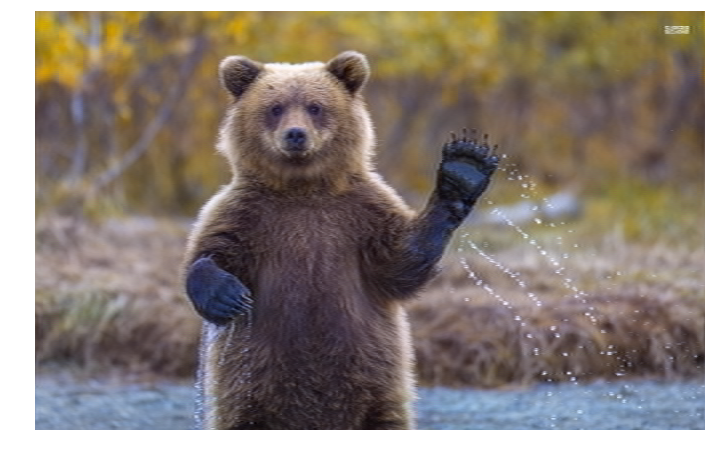

In [7]:
plt.figure(figsize=(12,9))
plt.imshow(X_hat.reshape(1050, 1680, 3))
plt.axis('off')
plt.show()

Восстановленная картинка почти не отличается от оригинала.

##Задание 5

###Зашумляем изображение

In [8]:
import random
from scipy.stats import norm

In [9]:
X = picture.reshape((105 * 168, 10 * 10 * 3))
for i in range(700000):
    index_1 = np.random.randint(105 * 168)
    index_2 = np.random.randint(300)
    
    X[index_1, index_2] += norm.rvs(loc=0,scale=0.3)
    X[index_1, index_2] -= int(X[index_1, index_2]) 

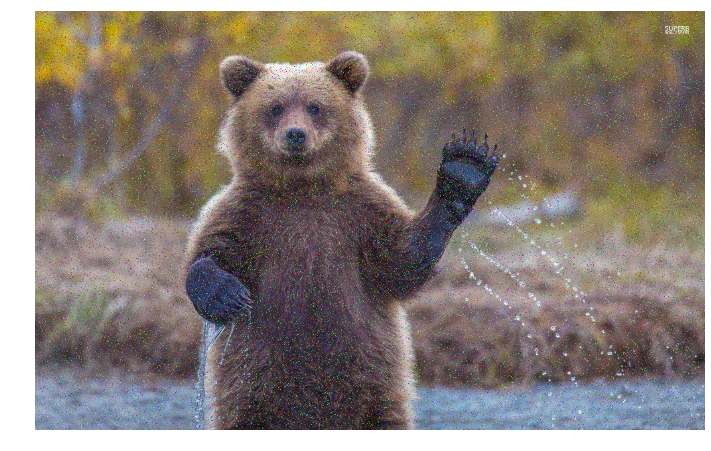

In [10]:
plt.figure(figsize=(12,9))
plt.imshow(X.reshape(1050, 1680, 3))
plt.axis('off')
plt.show()

### Рисуем востановленную картинку для каждого значения числа главных компонент

/home/anya/ipython-env/local/lib/python2.7/site-packages/matplotlib/axes/_subplots.py:69: MatplotlibDeprecationWarning: The use of 0 (which ends up being the _last_ sub-plot) is deprecated in 1.4 and will raise an error in 1.5
  mplDeprecation)


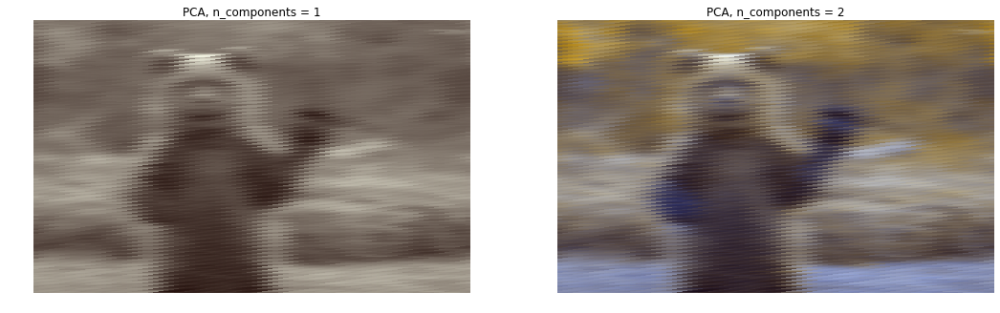

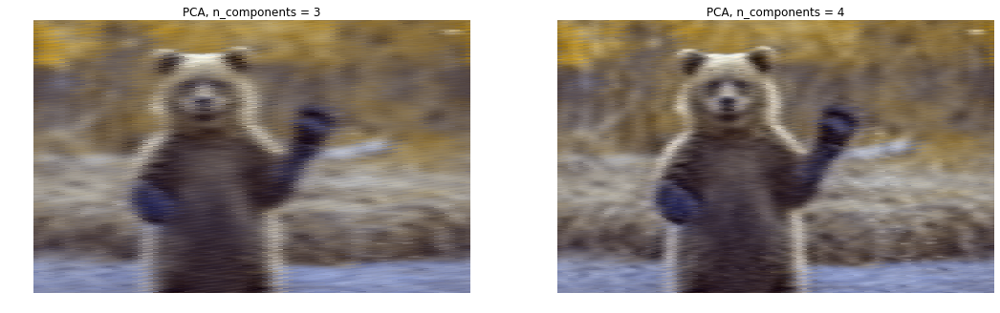

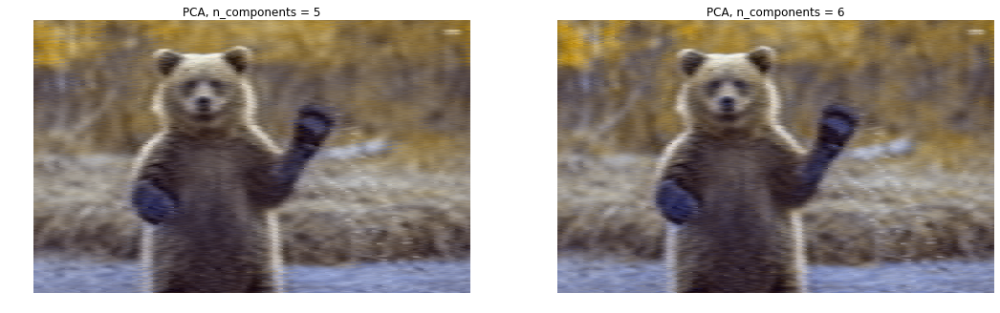

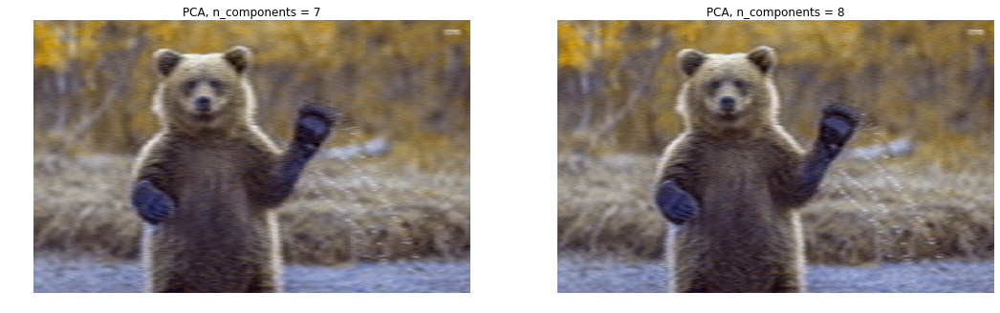

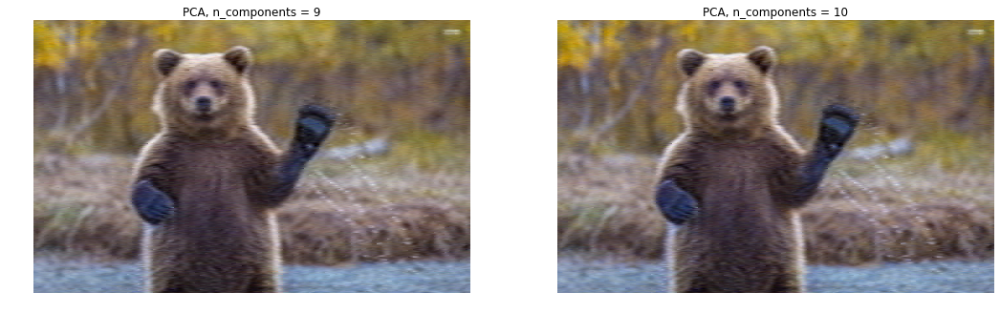

...

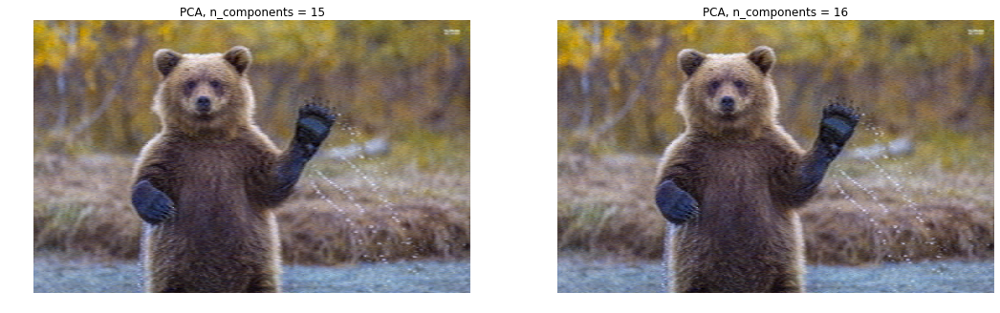

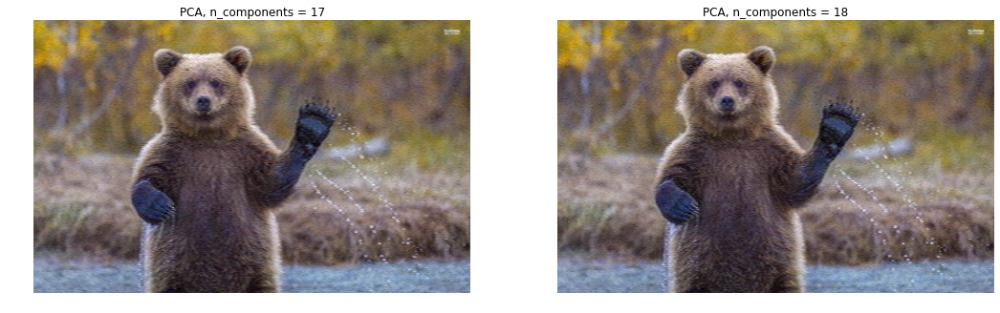

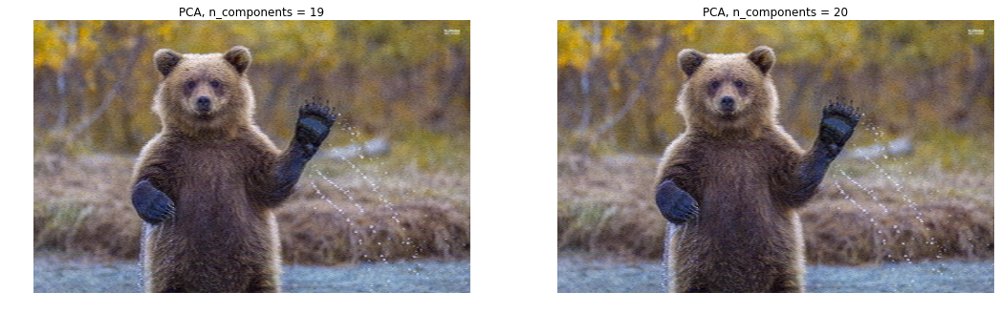

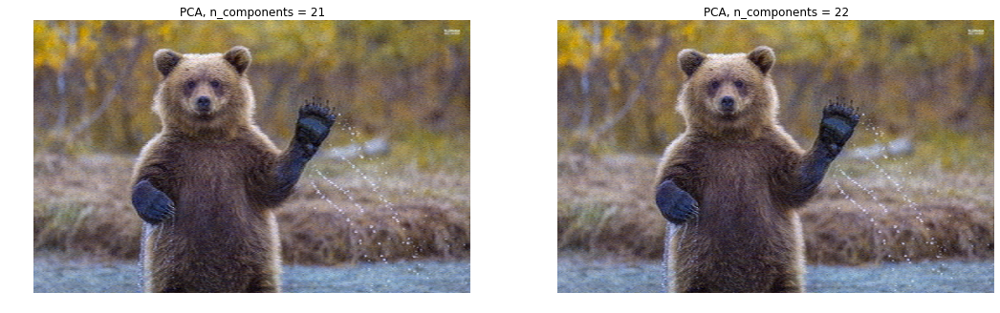

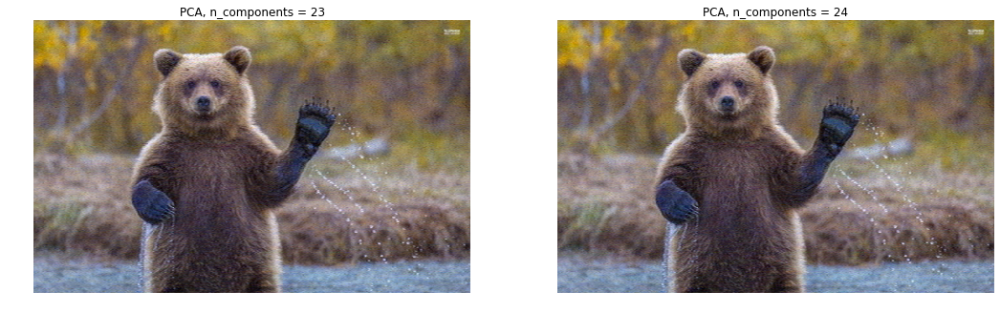

In [11]:
for i in range(1, 25):
    pca = PCA(n_components=i)
    transform_X = pca.fit_transform(X)
    pca = PCA(n_components=i)
    
    transform_X = pca.fit_transform(X)
    X_hat = pca.inverse_transform(transform_X)
    X_hat = X_hat * (X_hat < 1) + (X_hat >= 1)  
    X_hat = X_hat * (X_hat > 0)
    
    if i%2 == 1:
        plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 2, i%2)
    plt.imshow(X_hat.reshape(1050, 1680, 3))
    plt.title("PCA, n_components = {}".format(i))
    plt.axis('off')
    
    if i%2 == 0:
        plt.show()

### Вывод
Уже 16 компонент достататочно для восстановления хорошей картинки.